# Mar 15
- check the ETV6 peaks that lost in the C1/31/33 sample,
- but identified in the wt k562 cells for MNX1 enrichment in these peaks. 


# Mar 8 1:1 w/ Bisi
- K562 Clone 31 vs WT for MNX1 ChIP-Seq to define the MNX1 different binding peaks
- Same for ETV6 

In [1]:
import os
import pandas as pd
import re
from muon import atac as ac
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import muon as mu

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

# Inital setting for plot size
from matplotlib import rcParams

FIGSIZE = (3, 3)
plt.rcParams["figure.figsize"] = FIGSIZE


/lsf_tmp/218284875.tmpdir/ipykernel_456112/3403721765.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd
/home/whu78/conda3/envs/feb24/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import rpy2.robjects as ro
from rpy2.robjects.packages import importr
from rpy2.robjects import pandas2ri
%load_ext rpy2.ipython 

In [3]:
from itables import init_notebook_mode
init_notebook_mode(all_interactive=True)


In [4]:
%matplotlib inline


In [5]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category = UserWarning)
warnings.filterwarnings("ignore", category = RuntimeWarning)


In [6]:
from IPython.display import Image


In [43]:
%%R
library(data.table)
library(dplyr)
library(ChIPseeker)
library(TxDb.Hsapiens.UCSC.hg38.knownGene)
library(EnsDb.Hsapiens.v75)
library(clusterProfiler)
library(AnnotationDbi)
library(org.Hs.eg.db)
library(ggplot2)
library(gridExtra)
library(IRdisplay)
library(ChIPpeakAnno)
library(IRdisplay)
library(ggpubr)
library(DiffBind)
library(kableExtra)

txdb <- TxDb.Hsapiens.UCSC.hg38.knownGene


# make the design table

In [8]:
# sort/index bam files
dirs = ['/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/BisiMiao/ChIP-seq/K562_MNX1_Run26/bamfiles_hg38/',
        '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/BisiMiao/ChIP-seq/K562_ETV6_KimLab_Run38/bamfiles_hg38/',
        '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/BisiMiao/ChIP-seq/K562_MNX1_abcam_run32/bamfiles_hg38/'] 
for dd in dirs:
    os.chdir(dd)
    for f in os.listdir():
        file_pattern = r"S\d+\.bam" 
        if re.search(file_pattern, f):
            outfile = re.sub('.bam$', '_sorted.bam', f)
            cmd = 'samtools sort -o ' + outfile + ' ' + f
            #subprocess.run(cmd)
            print(cmd)
            cmd = 'samtools index ' + outfile
            print(cmd)
os.chdir('/home/whu78/Wen_Collab/Lab_Members/WenhuoHu/BisiMiao')


samtools sort -o BM_MNX1_ChIP_t7_12_c1_K562_S11_sorted.bam BM_MNX1_ChIP_t7_12_c1_K562_S11.bam
samtools index BM_MNX1_ChIP_t7_12_c1_K562_S11_sorted.bam
samtools sort -o BM_MNX1_ChIP_t7_12_WT_K562_S14_sorted.bam BM_MNX1_ChIP_t7_12_WT_K562_S14.bam
samtools index BM_MNX1_ChIP_t7_12_WT_K562_S14_sorted.bam
samtools sort -o BM_MNX1_ChIP_t7_12_c31_K562_S12_sorted.bam BM_MNX1_ChIP_t7_12_c31_K562_S12.bam
samtools index BM_MNX1_ChIP_t7_12_c31_K562_S12_sorted.bam
samtools sort -o BM_MNX1_ChIP_t7_12_c33_K562_S13_sorted.bam BM_MNX1_ChIP_t7_12_c33_K562_S13.bam
samtools index BM_MNX1_ChIP_t7_12_c33_K562_S13_sorted.bam
samtools sort -o BM_ETV6_Kim_ChIP_t7_12_c1_K562_S25_sorted.bam BM_ETV6_Kim_ChIP_t7_12_c1_K562_S25.bam
samtools index BM_ETV6_Kim_ChIP_t7_12_c1_K562_S25_sorted.bam
samtools sort -o BM_ETV6_Kim_ChIP_t7_12_WT_K562_S28_sorted.bam BM_ETV6_Kim_ChIP_t7_12_WT_K562_S28.bam
samtools index BM_ETV6_Kim_ChIP_t7_12_WT_K562_S28_sorted.bam
samtools sort -o BM_ETV6_Kim_ChIP_t7_12_c33_K562_S27_sorted.bam 

In [ ]:
%%R
# ChIP-Seq
sample_name = c(
    'BM_MNX1_ChIP_t7_12_1_K562_S19', 'BM_MNX1_ChIP_t7_12_31_K562_S20', 'BM_MNX1_ChIP_t7_12_33_K562_S21', 'BM_MNX1_ChIP_WT_K562_S22',
    'BM_MNX1_abcam_ChIP_t7_12_c1_K562_S9', 'BM_MNX1_abcam_ChIP_t7_12_c31_K562_S10', 'BM_MNX1_abcam_ChIP_t7_12_c33_K562_S11', 'BM_MNX1_abcam_ChIP_t7_12_WT_K562_S12',
    'BM_ETV6_Kim_ChIP_t7_12_c1_K562_S25', 'BM_ETV6_Kim_ChIP_t7_12_c31_K562_S26', 'BM_ETV6_Kim_ChIP_t7_12_c33_K562_S27', 'BM_ETV6_Kim_ChIP_t7_12_WT_K562_S28')

sample_name2 = c(
    'BM_MNX1_ChIP_t7_12_c1_K562_S11', 'BM_MNX1_ChIP_t7_12_c31_K562_S12', 'BM_MNX1_ChIP_t7_12_c33_K562_S13', 'BM_MNX1_ChIP_t7_12_WT_K562_S14',
    'BM_MNX1_abcam_ChIP_t7_12_c1_K562_S9', 'BM_MNX1_abcam_ChIP_t7_12_c31_K562_S10', 'BM_MNX1_abcam_ChIP_t7_12_c33_K562_S11', 'BM_MNX1_abcam_ChIP_t7_12_WT_K562_S12',
    'BM_ETV6_Kim_ChIP_t7_12_c1_K562_S25', 'BM_ETV6_Kim_ChIP_t7_12_c31_K562_S26', 'BM_ETV6_Kim_ChIP_t7_12_c33_K562_S27', 'BM_ETV6_Kim_ChIP_t7_12_WT_K562_S28')

sample_id = c('MNX1_C1', 'MNX1_C31', 'MNX1_C33', 'MNX1_WT', 
              'MNX1_abcam_C1', 'MNX1_abcam_C31', 'MNX1_abcam_C33', 'MNX1_abcam_WT', 
              'ETV6_Kim_C1', 'ETV6_Kim_C31', 'ETV6_Kim_C33', 'ETV6_Kim_WT') 

base_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/BisiMiao/ChIP-seq/K562_MNX1_abcam_run32/'

# use broad peak for MNX1
design_chip = data.table(sample_name = sample_name, sample_id = sample_id, 
                         peak_file = paste0(base_dir, '/peaks_hg38_macs14/', sample_name, '_bowtie2_nomodel_bed_peaks.bed'))

# use broad peak for MNX1
base_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/BisiMiao/ChIP-seq/K562_ETV6_KimLab_Run38/peaks_hg38_macs14/'
design_chip[9:12, peak_file := paste0(base_dir, sample_name, '_bowtie2_nomodel_bed_peaks.bed')] 
#BM_MNX1_ChIP_WT_K562_S22_bowtie2_nomodel_bed_peaks.bed

design_chip[, bigwig_file := sub('peaks_hg38.*', 'normed_bigwig_hg38/', peak_file)]
design_chip[, bigwig_file := paste0(bigwig_file, sample_name, '.bw')] 
file.exists(design_chip$bigwig_file)
file.exists(design_chip$peak_file)

design_chip[1:4, bam_file := paste0('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/BisiMiao/ChIP-seq/K562_MNX1_Run26/bamfiles_hg38/', sample_name2[1:4], '_sorted.bam')]
design_chip[5:8, bam_file := paste0('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/BisiMiao/ChIP-seq/K562_MNX1_abcam_run32/', 'bamfiles_hg38/', sample_name, '_sorted.bam')]
design_chip[9:12, bam_file := paste0('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/BisiMiao/ChIP-seq/K562_ETV6_KimLab_Run38/bamfiles_hg38/', sample_name, '_sorted.bam')]


In [10]:
%%R 
file.exists(design_chip[, bam_file])

 [1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE


In [11]:
%%R

sample_name = c('BM_H3K27acChIP_t7_12_Clone_1_K562_S1',
                'BM_H3K27acChIP_t7_12_Clone_31_K562_S2',
                'BM_H3K27acChIP_t7_12_Clone_33_K562_S3',
                'BM_H3K27acChIP_WT_K562_S4')

sample_id = c('H3K27ac_C1',
              'H3K27ac_C31',
              'H3K27ac_C33',
              'H3K27ac_WT') 

base_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Genomics/ChIP-seq/K562_H3K27ac_Bisi/'
design_h3 = data.table(sample_name = sample_name, sample_id = sample_id, peak_file = paste0(base_dir, '/peaks_hg38/', sample_name, '_bowtie2_nomodel_peaks.narrowPeak'))
design_h3[, bigwig_file := paste0(base_dir, '/normed_bigwig_hg38/', sample_name, '.bw')]
design_h3[, bam_file := paste0(base_dir, '/bamfiles_hg38/', sample_name, '_sorted.bam')]
file.exists(design_h3$bigwig_file)
file.exists(design_h3$bam_file)
#design_h3$peak_file


[1] TRUE TRUE TRUE TRUE


In [12]:
%%R

base_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Genomics/ATAC-seq/K562_MNX1_Bisi'
sample_name = c('BM_ATAC_seq_1_K562_S1', 'BM_ATAC_seq_31_K562_S2', 'BM_ATAC_seq_33_K562_S3', 'BM_ATAC_seq_WT_K562_S4')
sample_id = c('ATAC_C1',
              'ATAC_C31',
              'ATAC_C33',
              'ATAC_WT')  
design_atac = data.table(sample_name = sample_name, sample_id = sample_id, peak_file = paste0(base_dir, '/peaks_hg38/', sample_name, '_bowtie1_nomodel_peaks.narrowPeak'))
design_atac[, bigwig_file := paste0(base_dir, '/normed_bigwig_hg38/', sample_name, '_trimmed.dedupped_shifted.bw')]
design_atac[, bam_file := paste0(base_dir, '/bamfiles_hg38/', sample_name, '_trimmed_dedupped_sorted.bam')]
file.exists(design_atac$bigwig_file)
file.exists(design_atac$bam_file)
#/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Genomics/ATAC-seq/K562_MNX1_Bisi


[1] TRUE TRUE TRUE TRUE


In [13]:
%%R -o design
design = rbindlist(list(chip = design_chip,  histone = design_h3, atac = design_atac), idcol = T, fill = T)
head(design)
(design$bigwig_file)[13]

all(file.exists(design$peak_file),
    file.exists(design$bigwig_file),
    file.exists(design$bam_file))


[1] TRUE


In [34]:
%%R
saveRDS(design, file = 'design.rds')


# identify the differentially binding peaks
- this failed because of lack replications

In [49]:
%%R 
sample_sheet = copy(design)
sample_sheet[, SampleID := sample_id]
sample_sheet[, Tissue := 'K562']
sample_sheet[, Factor := sub('.*_(.*)', '\\1', sample_id)]
sample_sheet[, Condition := sub('\\d+', '', Factor)]
sample_sheet[, Treatment := 'Media']
sample_sheet[, Replicate := 1]
sample_sheet[, bamReads := bam_file]
sample_sheet[, Peaks := peak_file]
sample_sheet[, ControlID := 'Ctrl']
sample_sheet[, bamControl := design[10, bam_file]]
sample_sheet[, PeakCaller := 'bed']
#fread('tamoxifen.csv')
# ControlID,bamControl
sample_sheet$Condition


 [1] "C"  "C"  "C"  "WT" "C"  "C"  "C"  "WT" "C"  "C"  "C"  "WT" "C"  "C"  "C" 
[16] "WT" "C"  "C"  "C"  "WT"


In [ ]:
%%R
sh = sample_sheet[1:4, .(SampleID, Tissue, Factor, Condition, Treatment, Replicate, bamReads, ControlID, bamControl, Peaks, PeakCaller)]

#set_1$class[DBA_CONDITION,]
set_1 = dba(sampleSheet=sh)
set_1 = dba.count(set_1)
set_1 = dba.blacklist(set_1) 
set_1 = dba.normalize(set_1) 

saveRDS(set_1, file = 'set_1.rds')
#set_all = readRDS('set_all.rds')

In [65]:
%%R
set_1 = readRDS('set_1.rds')

In [66]:
%%R
set_1 = dba.contrast(tamoxifen, reorderMeta=list(Condition="C"))
dba.report(set_1)



Error: Specified contrast number is greater than number of contrasts


RInterpreterError: Failed to parse and evaluate line 'res = dba.report(set_1)\n#res\n'.
R error message: 'Error: Specified contrast number is greater than number of contrasts'

In [54]:
%%R
info = dba.show(set_1)
libsizes <- cbind(LibReads=info$Reads, FRiP=info$FRiP, PeakReads=round(info$Reads * info$FRiP))
rownames(libsizes) <- info$ID
libsizes


         LibReads FRiP PeakReads
MNX1_C1  23091133 0.02    461823
MNX1_C31 22099162 0.03    662975
MNX1_C33 21026363 0.03    630791
MNX1_WT  23077100 0.03    692313


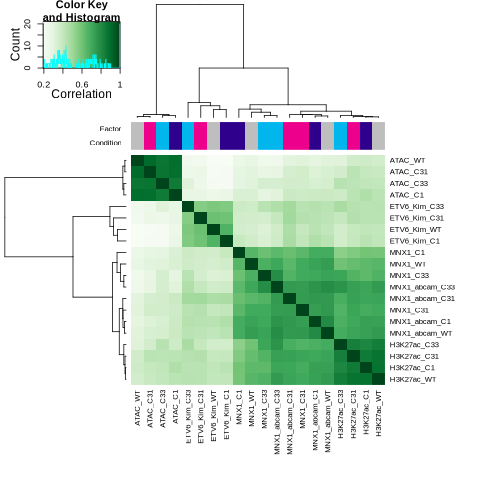

In [25]:
%%R
plot(set_all[1:12,])

In [62]:
%%R
class(set_1)
#dba.plotVolcano(set_1)


[1] "DBA"


# read peaks and do simple annotation

In [15]:
%%R
peakAnnoList <- lapply(design$peak_file, annotatePeak, TxDb=txdb, tssRegion=c(-3000, 3000), verbose=FALSE)
names(peakAnnoList) = design$sample_id


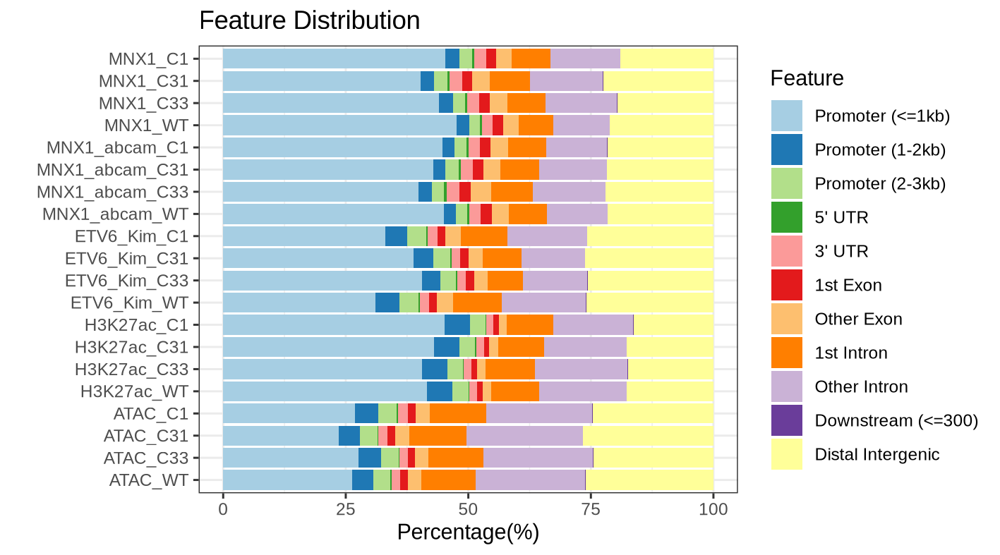

In [18]:
%%R -w 18 -h 10 -u cm -r 200
plotAnnoBar(peakAnnoList)


# revise the annotation: add a simplified annotation for gene locations

In [447]:
%%R
# add gene symbol to the annotated results
peak_anno = lapply(peakAnnoList, function(tmp){
    anno = as.data.table(tmp@anno)
    # Get the entrez IDs
    entrez <- anno$geneId

    # Return the gene symbol for the set of Entrez IDs
    annotations_edb <- AnnotationDbi::select(EnsDb.Hsapiens.v75,
                                         keys = entrez,
                                         columns = c("GENENAME"),
                                         keytype = "ENTREZID")

    # Change IDs to character type to merge
    annotations_edb$ENTREZID <- as.character(annotations_edb$ENTREZID)

    anno = merge(anno, annotations_edb, by.x = 'geneId', by.y = 'ENTREZID', all.x = T)
    anno
})


In [448]:
%%R
# add a column with simple annotation
# export the annotated peaks
peak_anno = lapply(1:nrow(design), function(ii){
    an = peak_anno[[ii]]
    an[, ann := annotation]
    an[grep('Intron', annotation), ann := 'Intron']
    an[grep('Exon', annotation), ann := 'Exon']
    an[grep('Promoter', annotation), ann := 'Promoter']
    an[grep('Downstream', annotation), ann := 'Downstream']
    an 
})


In [449]:
%R head(peak_anno[[1]])

geneId seqnames      start        end  width strand               V4  \
1         10     chr8   18528624   18528624      1      *  MACS_peak_23139   
2        100    chr20   44652164   44652164      1      *  MACS_peak_15055   
3        100    chr20   44652164   44652164      1      *  MACS_peak_15055   
4      10000     chr1  243851095  243851095      1      *   MACS_peak_2870   
5      10001    chr14   70599937   70599937      1      *   MACS_peak_7490   
6  100037417    chr22   23967505   23967505      1      *  MACS_peak_15793   

     V5        annotation  geneChr  geneStart    geneEnd  geneLength  \
1   9.0            3' UTR        8   18391287   18400993        9707   
2  14.0  Promoter (<=1kb)       20   44619522   44652215       32694   
3  14.0  Promoter (<=1kb)       20   44619522   44652215       32694   
4  23.0  Promoter (<=1kb)        1  243505249  243851079      345831   
5  12.0  Promoter (<=1kb)       14   70581257   70600643       19387   
6  13.0  Promoter (<=1kb)       22   23966888   23972556        5669   

   geneStrand        transcriptId  distanceToTSS GENENAME       ann  
1           1   ENST00000520116.1       137337.0     NAT2    3' UTR  
2           2   ENST00000696062.1           51.0      ADA  Promoter  
3           2   ENST00000696062.1           51.0   LRG_16  Promoter  
4           2  ENST00000263826.12          -16.0     AKT3  Promoter  
5           2   ENST00000554963.5          706.0     MED6  Promoter  
6           1   ENST00000215770.6          617.0     DDTL  Promoter

In [450]:
%%R 
# V5 score
summary(peak_anno[[1]]$V5)
design$sample_id

 [1] "MNX1_C1"        "MNX1_C31"       "MNX1_C33"       "MNX1_WT"       
 [5] "MNX1_abcam_C1"  "MNX1_abcam_C31" "MNX1_abcam_C33" "MNX1_abcam_WT" 
 [9] "ETV6_Kim_C1"    "ETV6_Kim_C31"   "ETV6_Kim_C33"   "ETV6_Kim_WT"   
[13] "H3K27ac_C1"     "H3K27ac_C31"    "H3K27ac_C33"    "H3K27ac_WT"    
[17] "ATAC_C1"        "ATAC_C31"       "ATAC_C33"       "ATAC_WT"       


# find the genes that have peak in their promoter and plot heatmap


In [77]:
%%R
genes = lapply(1:nrow(design), function(ii){
    an = peak_anno[[ii]]
    an[ann == 'Promoter' & V5 > 500, .(GENENAME)]
})
genes = unique(unlist(genes))

gene_bed = fread('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/YuannyuZhang/Data/UCSC/hg38/genes.bed')
head(gene_bed)

gene_bed_sel = gene_bed[V4 %in% genes, ]
fwrite(gene_bed_sel, file = 'gene_sel.bed', sep = '\t', col.names = F) 

length(genes)


[1] 6947


In [81]:
%%R -o cmd
tmp = design[1:12,]
cmd = paste0("source /home/whu78/.bashrc && conda activate epi && computeMatrix reference-point -S ", paste(tmp$bigwig_file, collapse = ' '))
#cmd = paste0("computeMatrix reference-point -S ", paste(design$bigwig_file, collapse = ' '))
cmd = paste0(cmd, ' -a 3000 -b 3000 -R gene_sel.bed ')
cmd = paste0(cmd, ' --samplesLabel ', paste(tmp$sample_id, collapse = ' '), ' -o matrix_mat_ref_run6.gz -p 5 --referencePoint TSS')
cmd
write(cmd, file = 'run6.sh')


In [429]:
! . ~/.bashrc && conda activate epi && plotHeatmap -m matrix_mat_ref_run6.gz \
     -out ExampleHeatmap6.png \
     --colorMap RdBu_r \
     --zMin 0 0 0 0 0 0 0 0 0 0 0 0  --zMax 25 25 25 25 25 25 25 25 10 10 10 10 \
     --yMin 0 0 0 0 0 0 0 0 0 0 0 0  --yMax 25 25 25 25 25 25 25 25 10 10 10 10 \
     --kmeans 2
#     --whatToShow 'heatmap and colorbar' \


*Warning* For clustering nan values have to be replaced by zeros 


In [446]:
! . ~/.bashrc && conda activate epi && plotHeatmap -m matrix_mat_ref_run6.gz \
     -out ExampleHeatmap6_v1.pdf \
     --colorMap RdBu_r \
     --yMin 0 --yMax 25 \
     --kmeans 2 

! . ~/.bashrc && conda activate epi && plotHeatmap -m matrix_mat_ref_run6.gz \
     -out ExampleHeatmap6_v2.pdf \
     --colorMap RdBu_r \
     --yMin 0 --yMax 10 \
     --kmeans 2 

*Warning* For clustering nan values have to be replaced by zeros 
*Warning* For clustering nan values have to be replaced by zeros 


In [ ]:
Image("ExampleHeatmap6.png")


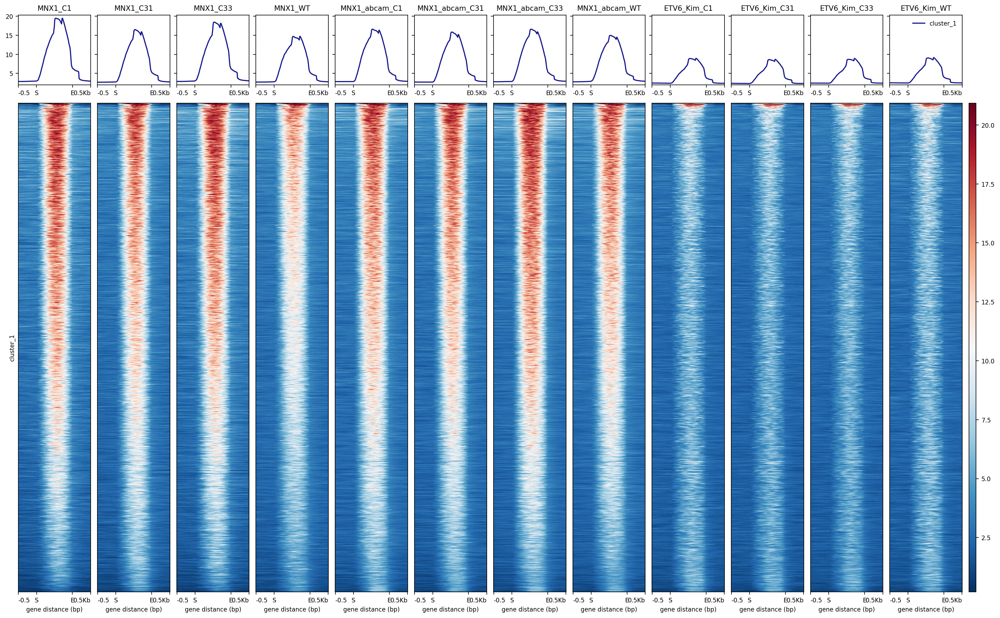

In [438]:
Image("ExampleHeatmap6.png")


# find peaks that have binding for both MNX1 and ETV6

In [423]:
fnames = " ".join(design.iloc[0:7]['peak_file'].values)
! bedops --everything $fnames | bedmap --count --echo --bp-ovr 1 --delim '\t' - | awk '($1>1)' | cut -f2- | bedops --merge - > mnx.bed
fnames = " ".join(design.iloc[8:11]['peak_file'].values)
! bedops --everything $fnames | bedmap --count --echo --bp-ovr 1 --delim '\t' - | awk '($1>1)' | cut -f2- | bedops --merge - > etv.bed

! bedops --everything mnx.bed etv.bed | bedmap --count --echo --bp-ovr 1 --delim '\t' - | awk '($1>1)' | cut -f2- | bedops --merge - >inter.bed
! bedops -n -1 inter.bed hg38_blacklist.bed > inter_filtered.bed
! grep -c '' inter_filtered.bed


8201


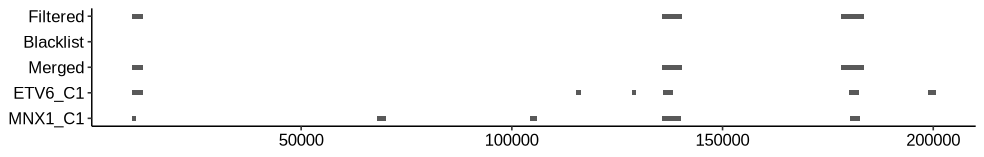

In [424]:
%%R -w 25 -h 4 -u cm -r 100
# verify the merged bed file
df1 = fread(design$peak_file[1], header = F); colnames(df1) = c('seqnames', 'start', 'end', 'names', 'score')
df2 = fread(design$peak_file[9], header = F); colnames(df2) = c('seqnames', 'start', 'end', 'names', 'score')
df3 = fread('inter.bed', header = F); colnames(df3) = c('seqnames', 'start', 'end')
df4 = fread('hg38_blacklist.bed', header = F); colnames(df4) = c('seqnames', 'start', 'end')
df5 = fread('inter_filtered.bed', header = F); colnames(df5) = c('seqnames', 'start', 'end')

mm = 200000
df1_2 = df1[seqnames == 'chr1' & start < mm, ]
df2_2 = df2[seqnames == 'chr1' & start < mm, ]
df3_2 = df3[seqnames == 'chr1' & start < mm, ]
df4_2 = df4[seqnames == 'chr1' & start < mm, ]
df5_2 = df5[seqnames == 'chr1' & start < mm, ]

df_list = list(MNX1_C1 = df1_2, ETV6_C1 = df2_2, Merged = df3_2, Blacklist = df4_2, Filtered = df5_2)
plotdat = rbindlist(df_list, idcol = T, fill = T)
plotdat[, yy := as.integer(factor(.id, levels = names(df_list)))]
plotdat[, yy1 := yy + .1]
plotdat[, yy2 := yy - .1]

ggplot(plotdat) + geom_rect(aes(xmin = start, xmax = end, ymin = yy1, ymax = yy2)) +  
scale_y_continuous(breaks = c(1, 2, 3, 4, 5), labels = c("MNX1_C1","ETV6_C1","Merged", "Blacklist", "Filtered")) + theme_pubr()


In [425]:
%%R -o cmd
tmp = design[1:12,]
cmd = paste0("source /home/whu78/.bashrc && conda activate epi && computeMatrix scale-regions -S ", paste(tmp$bigwig_file, collapse = ' '))
#cmd = paste0("computeMatrix reference-point -S ", paste(design$bigwig_file, collapse = ' '))
cmd = paste0(cmd, ' -a 500 -b 500 -R inter_filtered.bed ')
cmd = paste0(cmd, ' --samplesLabel ', paste(tmp$sample_id, collapse = ' '), ' -o matrix_mat_region_run7.gz -p 5 ')
cmd
write(cmd, file = 'run7.sh')


In [ ]:
cmd_ex = cmd[0]
! $cmd_ex

In [434]:
! . ~/.bashrc && conda activate epi && plotHeatmap -m matrix_mat_region_run7.gz \
     -out ExampleHeatmap7.png \
     --colorMap RdBu_r --startLabel S --endLabel E \
     --kmeans 1 
#--yMin 0 0 0 0 0 0 0 0 0 0 0 0  --yMax 25 25 25 25 25 25 25 25 10 10 10 10 \
#--zMin 0 0 0 0 0 0 0 0 0 0 0 0  --zMax 25 25 25 25 25 25 25 25 10 10 10 10 \


*Warning* For clustering nan values have to be replaced by zeros 


In [439]:
! . ~/.bashrc && conda activate epi && plotHeatmap -m matrix_mat_region_run7.gz \
     -out ExampleHeatmap7_plot.png \
     --colorMap RdBu_r --startLabel S --endLabel E \
     --kmeans 1 


*Warning* For clustering nan values have to be replaced by zeros 


In [444]:
! . ~/.bashrc && conda activate epi && plotHeatmap -m matrix_mat_region_run7.gz \
     -out ExampleHeatmap7_v1.pdf \
     --colorMap RdBu_r \
     --yMin 0 --yMax 25 

! . ~/.bashrc && conda activate epi && plotHeatmap -m matrix_mat_region_run7.gz \
     -out ExampleHeatmap7_v2.pdf \
     --colorMap RdBu_r \
     --yMin 0 --yMax 10 


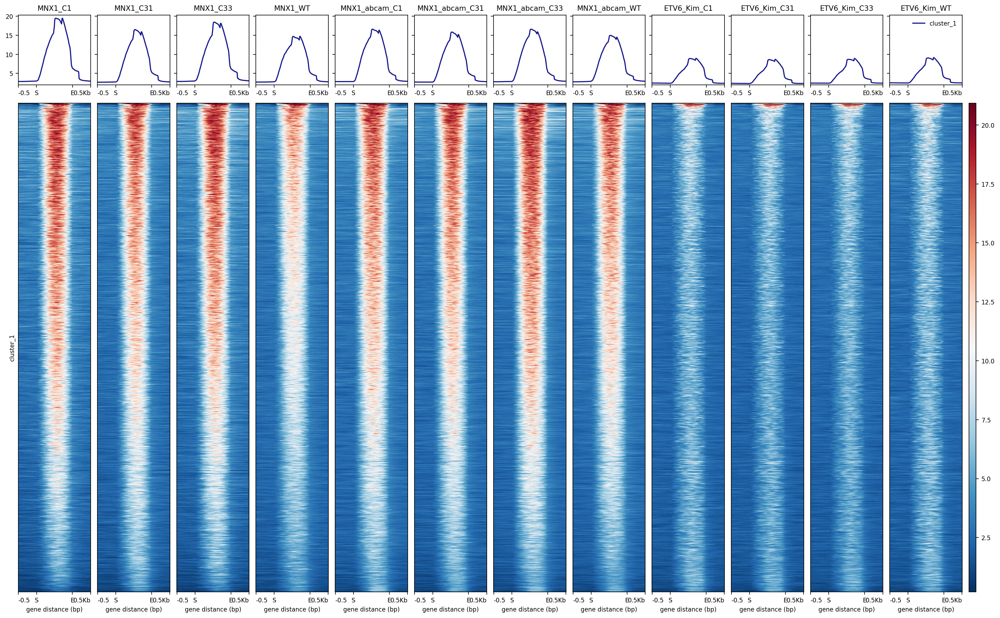

In [440]:
Image("ExampleHeatmap7.png")


# find overlapped peaks for MNX1 and ETV6 

In [492]:
fname1 = design.iloc[0]['peak_file']
fname2 = design.iloc[11]['peak_file']
#! bedops --everything $fname1 $fname2 | bedmap --count --echo --bp-ovr 1 --delim '\t' - | awk '($1>1)' | cut -f2- | bedops --merge - > ov.bed
! bedops --everything $fname1 $fname2 | bedmap --count --echo --range 1000 --delim '\t' - | awk '($1>1)' | cut -f2- | bedops --merge - > ov.bed

a = ! grep -c '' $fname1
b = ! grep -c '' $fname2
c = ! grep -c '' ov.bed

a = int(a[0])
b = int(b[0])
c = int(c[0])

a, b, c


(25645, 22218, 10122)

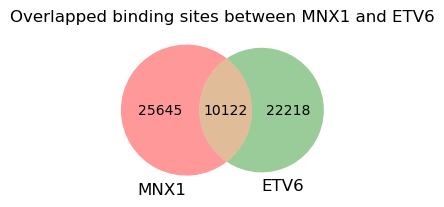

In [493]:
from matplotlib_venn import venn2, venn2_circles

#v = venn2(subsets=(25645,22218,8455), set_labels = ['MNX1', 'ETV6'])
v = venn2(subsets=(a,b,c), set_labels = ['MNX1', 'ETV6'])

plt.title("Overlapped binding sites between MNX1 and ETV6")
plt.show()


# functional enrichment of target genes

In [462]:
%%R  
# gene ontology enrichment analysis
peak_anno_ego_bp = lapply(peak_anno, function(tmp){
    ego <- enrichGO(gene = tmp$geneId, keyType = "ENTREZID", OrgDb = org.Hs.eg.db, ont = "BP", 
                        pAdjustMethod = "BH", qvalueCutoff = 0.05, readable = TRUE)
    data.frame(ego)
    })
save(peak_anno_ego_bp, file = 'peak_anno_ego_bp.rds')


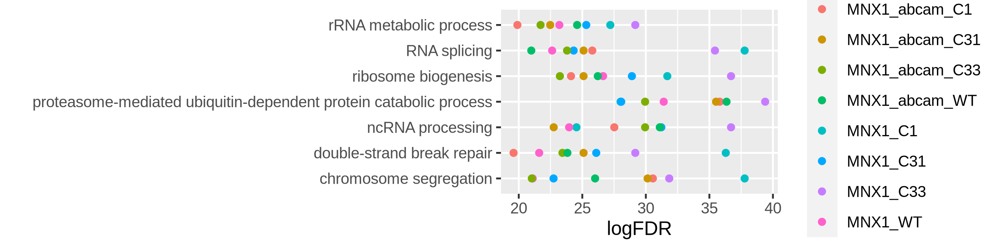

In [467]:
%%R -w 20 -h 5 -u cm -r 300
peak_anno_ego = peak_anno_ego_bp
gg_list = lapply(peak_anno_ego, function(ego){
    ego = as.data.table(ego, keep.rownames = T)
    ego[, logFDR := -log(qvalue)]
    ego = ego[20:1, ]
    ego[, Description := factor(Description, levels = ego$Description)]
    ggplot(ego, aes(logFDR, Description)) + geom_point() + ylab('') 
})

names(peak_anno_ego) = design$sample_id
peak_anno_ego_dt = rbindlist(peak_anno_ego, idcol = T)
head(peak_anno_ego_dt)

top20_list = lapply(peak_anno_ego, function(ego){
    ego = as.data.table(ego, keep.rownames = T)
    ego[, logFDR := -log(qvalue)]
    ego[20:1, Description]
})

go_mnx1 = Reduce(intersect, top20_list[1:8])
ego = peak_anno_ego_dt[Description %in% go_mnx1, ][grep('MNX1', .id), ]
ego[, logFDR := -log(qvalue)]
options(repr.plot.width = 8, repr.plot.height = 3, repr.plot.res = 300)
print(ggplot(ego, aes(logFDR, Description, color = .id)) + geom_point() + ylab('') )


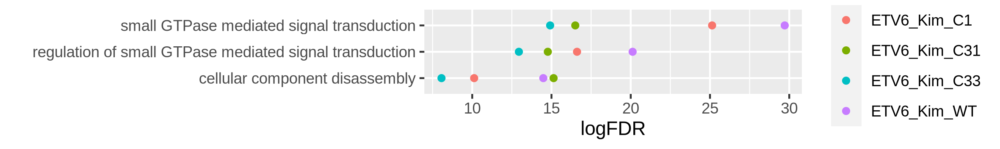

In [473]:
%%R -w 20 -h 3 -u cm -r 300
go_etv6 = Reduce(intersect, top20_list[9:12])
ego = peak_anno_ego_dt[Description %in% go_etv6, ][grep('ETV', .id), ]
ego[, logFDR := -log(qvalue)]
options(repr.plot.width = 8, repr.plot.height = 3, repr.plot.res = 300)
print(ggplot(ego, aes(logFDR, Description, color = .id)) + geom_point() + ylab('') )  
